In [2]:
import numpy as np
import pandas as pd 

from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.utils import to_categorical
from keras import regularizers

In [3]:
#fixed random seed for reproducibility 
np.random.seed(0)

In [4]:
# load dataset (input variables = X, output variables = Y)
df = pd.read_csv("2.csv")

#count the number of occurances for each osID
OsID_counts = df['OsID'].value_counts()

#filter for osIDs that have 10 or more occurances
OsID_counts_filtered = OsID_counts[OsID_counts >= 10]

#assign a label for each osID 
OsID_labels = {}
class_no = 0
for osID in OsID_counts_filtered.index:
    OsID_labels[osID] = class_no
    class_no +=1

#filter the dataset with osID that contain 10 or more occurances
dataGene = df[df['OsID'].isin(OsID_counts_filtered.index)]

dataGene = dataGene.drop(['Class', 'Trait'],axis=1)

# Add a new column 'class' to the filtered dataset
dataGene['class'] = dataGene['OsID'].map(OsID_labels)

#print("Summary of dataGene:\n",dataGene.describe())

In [5]:
X = dataGene.drop(['class','OsID'], axis=1) # exclude class & OsID column
Y = dataGene['class']

#input feature names in order of descending importance scores in MI feature selection method
feature_names = ['Root10DaysSeedling', 'Shoot10DaysSeedling', 'Root35DaysSeedling', 'Leaf45DaysOldPlant', 'Shoot35DaysSeedling',
                 'Root14DaysSeedling', 'Root24DaysSeedling', 'Root17DaysSeedling', 'Root21DaysSeedling', 'Shoot3DaysSeedling',
                 'Shoot21DaysSeedling', 'PCC', 'Shoot14DaysSeedling', 'Root52DaysSeedling', 'Shoot17DaysSeedling', 
                 'Leaf21DaysSeedling', 'log_2FoldChange', 'ET', 'PPI', 'CoExpression']

X_fs = X.reindex(columns=feature_names)

print("Shape of X:\n",X_fs.shape)
print("Shape of Y:\n",Y.shape)

# Statistical summary of the variables
#print("Summary of X:\n",X.describe())
#print("Summary of Y:\n",Y.describe())

# Check for class imbalance
print(df.groupby(Y).size())

# change both input and target variables datatype to ndarray

X_fs = X_fs.values # 2-D array

# select target variable 

Y = Y.values #1-D array
Y = Y.reshape(-1, 1)


Shape of X:
 (41110, 20)
Shape of Y:
 (41110,)
class
0.0      1800
1.0      1296
2.0      1260
3.0      1218
4.0      1026
5.0      1008
6.0       930
7.0       912
8.0       880
9.0       798
10.0      792
11.0      759
12.0      729
13.0      720
14.0      702
15.0      693
16.0      672
17.0      640
18.0      625
19.0      570
20.0      546
21.0      506
22.0      483
23.0      448
24.0      432
25.0      384
26.0      360
27.0      360
28.0      320
29.0      312
         ... 
343.0      12
344.0      12
345.0      12
346.0      12
347.0      12
348.0      12
349.0      12
350.0      12
351.0      12
352.0      12
353.0      12
354.0      12
355.0      11
356.0      11
357.0      11
358.0      11
359.0      11
360.0      11
361.0      10
362.0      10
363.0      10
364.0      10
365.0      10
366.0      10
367.0      10
368.0      10
369.0      10
370.0      10
371.0      10
372.0      10
Length: 373, dtype: int64


Class=0, n=1800 (4.378%)
Class=1, n=1296 (3.153%)
Class=2, n=1260 (3.065%)
Class=3, n=1218 (2.963%)
Class=4, n=1026 (2.496%)
Class=5, n=1008 (2.452%)
Class=6, n=930 (2.262%)
Class=7, n=912 (2.218%)
Class=8, n=880 (2.141%)
Class=9, n=798 (1.941%)
Class=10, n=792 (1.927%)
Class=11, n=759 (1.846%)
Class=12, n=729 (1.773%)
Class=13, n=720 (1.751%)
Class=14, n=702 (1.708%)
Class=15, n=693 (1.686%)
Class=16, n=672 (1.635%)
Class=17, n=640 (1.557%)
Class=18, n=625 (1.520%)
Class=19, n=570 (1.387%)
Class=20, n=546 (1.328%)
Class=21, n=506 (1.231%)
Class=22, n=483 (1.175%)
Class=23, n=448 (1.090%)
Class=24, n=432 (1.051%)
Class=25, n=384 (0.934%)
Class=26, n=360 (0.876%)
Class=27, n=360 (0.876%)
Class=28, n=320 (0.778%)
Class=29, n=312 (0.759%)
Class=30, n=312 (0.759%)
Class=31, n=306 (0.744%)
Class=32, n=304 (0.739%)
Class=33, n=299 (0.727%)
Class=34, n=297 (0.722%)
Class=35, n=296 (0.720%)
Class=36, n=280 (0.681%)
Class=37, n=264 (0.642%)
Class=38, n=260 (0.632%)
Class=39, n=253 (0.615%)
Clas

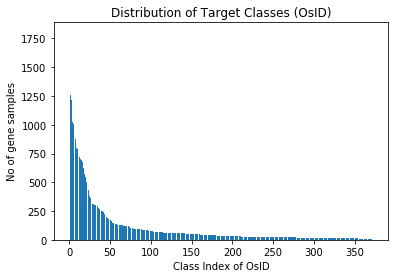

In [6]:
from collections import Counter
# summarize distribution
counter = Counter(Y.flatten())

# sort counter by keys
counter = dict(sorted(counter.items()))

for k,v in counter.items():
 per = v / len(Y.flatten()) * 100
 print('Class=%d, n=%d (%.3f%%)' % (k, v, per))
# plot the distribution
plt.bar( counter.keys(), counter.values())

plt.ylabel('No of gene samples')
plt.xlabel('Class Index of OsID')
plt.title('Distribution of Target Classes (OsID)')
plt.show()

In [7]:
def draw_confusion_matrix(cm):
    plt.figure(figsize=(12,8))
    sns.heatmap(cm,annot=True,fmt="d", center=0, cmap='autumn') 
    plt.title("Confusion Matrix")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [8]:
# prepare target data
def prepare_targets(y_train, y_test):
	le = LabelEncoder()
	
	#fit the encoders only to the training data and then transform both train and test data
	y_train_enc = le.fit_transform(y_train)
	y_test_enc = le.transform(y_test)

	return y_train_enc, y_test_enc

In [9]:
# define baseline model (MLP)
def MLP_model(input_dim):

    model = Sequential()
    model.add(Dense(60, input_dim=input_dim,bias_initializer='normal', activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(20,bias_initializer='normal',activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(20,bias_initializer='normal',activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(373,kernel_initializer='normal', activation='softmax')) #softmax for multi-class classification, num_classes = 373

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    return model

In [10]:
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_fs, Y, test_size=0.33, random_state=1)

# prepare output data
y_train_enc, y_test_enc = prepare_targets(y_train, y_test)

# Define the number of folds for k-fold cross-validation
k = 2

# Define the cross-validation method
cv_method = StratifiedKFold(n_splits=k)

# Initialize the list to store the history, train & validation(accuracy & loss) for each model
models = []
model_history = []
model_accuracy = []
model_train_acc = []
model_train_loss = []
model_val_acc = []
model_val_loss = []


for i in range(1,21):

    models_fold = []
    hist = []
    train_accuracy = []
    train_loss = []
    val_accuracy = []
    val_loss = []
    test_accuracy = []

    print("Number of input features:",i)

    # Select the input features from the input data
    X_train_selected = X_train[:, :i]
    X_test_selected = X_test[:, :i]

    # Loop over the folds
    for fold, (train_index, val_index) in enumerate(cv_method.split(X_train_selected, y_train)):

        print("Fold:", fold+1)

        # Split the data into train and validation sets using the current fold index
        X_train_fold  = X_train_selected[train_index]
        y_train_fold  = y_train[train_index]
        X_val_fold = X_train_selected[val_index]
        y_val_fold = y_train[val_index]

        # Prepare the target data
        y_train_fold_enc, y_val_fold_enc = prepare_targets(y_train_fold, y_val_fold)

        # build the model
        model = MLP_model(i)

        # Fit the model to the training data for the current fold
        history = model.fit(X_train_fold, to_categorical(y_train_fold_enc, num_classes=373), epochs=40, batch_size=5, verbose=1, validation_split = 0.33)
    
        # Evaluate the model on the validation data for the current fold
        val_scores = model.evaluate(X_val_fold, to_categorical(y_val_fold_enc, num_classes=373), verbose=0)
        val_accuracy.append(val_scores[1])
        val_loss.append(val_scores[0])

        # Evaluate the model on the test data for the current fold
        test_scores = model.evaluate(X_test_selected, to_categorical(y_test_enc, num_classes=373), verbose=0)
        test_accuracy.append(test_scores[1])

        # add the model to the list of models
        models_fold.append(model)
        hist.append(history)

        # store the training accuracy and loss for each fold
        train_accuracy.append(history.history['accuracy'])
        train_loss.append(history.history['loss'])
        
    # Calculate the average test and validation accuracy and loss across all folds
    avg_test_acc = sum(test_accuracy) / len(test_accuracy)
    avg_val_acc = sum(val_accuracy) / len(val_accuracy)
    avg_val_loss = sum(val_loss) / len(val_loss)

    # Print the average validation and test accuracy and loss
    print("Average Validation Accuracy:", avg_val_acc)
    print("Average Validation Loss:",avg_val_loss)
    print("Average Test Accuracy:", avg_test_acc)

    best_fold_index = test_accuracy.index(max(test_accuracy))
    model_accuracy.append(test_accuracy[best_fold_index])
    models.append(models_fold[best_fold_index])
    model_history.append(hist[best_fold_index])
    model_train_acc.append(train_accuracy[best_fold_index])
    model_train_loss.append(train_loss[best_fold_index])
    model_val_acc.append(val_accuracy[best_fold_index])
    model_val_loss.append(val_loss[best_fold_index])


    print("Final Test Accuracy for each fold:", test_accuracy[best_fold_index])

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated i

Number of input features: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dty

Fold: 1
Epoch 1/40
1834/1834 [==============================] - 12s 4ms/step - loss: 4.3872 - accuracy: 0.1126 - val_loss: 4.0457 - val_accuracy: 0.1570
Epoch 2/40
1834/1834 [==============================] - 7s 4ms/step - loss: 3.6904 - accuracy: 0.1904 - val_loss: 3.6838 - val_accuracy: 0.2863
Epoch 3/40
1834/1834 [==============================] - 8s 4ms/step - loss: 3.3829 - accuracy: 0.2452 - val_loss: 3.4572 - val_accuracy: 0.2484
Epoch 4/40
1834/1834 [==============================] - 8s 4ms/step - loss: 3.1387 - accuracy: 0.2628 - val_loss: 3.2489 - val_accuracy: 0.2626
Epoch 5/40
1834/1834 [==============================] - 7s 4ms/step - loss: 2.9465 - accuracy: 0.2857 - val_loss: 3.1491 - val_accuracy: 0.3195
Epoch 6/40
1834/1834 [==============================] - 7s 4ms/step - loss: 2.7963 - accuracy: 0.3123 - val_loss: 2.9832 - val_accuracy: 0.3379
Epoch 7/40
1834/1834 [==============================] - 8s 4ms/step - loss: 2.6698 - accuracy: 0.3387 - val_loss: 2.9173 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/40
1834/1834 [==============================] - 13s 5ms/step - loss: 4.1174 - accuracy: 0.1829 - val_loss: 3.4939 - val_accuracy: 0.2622
Epoch 2/40
1834/1834 [==============================] - 8s 4ms/step - loss: 2.8242 - accuracy: 0.4120 - val_loss: 2.7213 - val_accuracy: 0.4431
Epoch 3/40
1834/1834 [==============================] - 9s 5ms/step - loss: 2.1368 - accuracy: 0.5374 - val_loss: 2.2265 - val_accuracy: 0.5647
Epoch 4/40
1834/1834 [==============================] - 8s 4ms/step - loss: 1.7244 - accuracy: 0.5977 - val_loss: 1.8948 - val_accuracy: 0.6087
Epoch 5/40
1834/1834 [==============================] - 8s 4ms/step - loss: 1.4638 - accuracy: 0.6389 - val_loss: 1.7060 - val_accuracy: 0.6543
Epoch 6/40
1834/1834 [==============================] - 8s 5ms/step - loss: 1.2950 - accuracy: 0.6646 - val_loss: 1.6083 - val_accuracy: 0.6535
Epoch 7/40
1834/1834 [==============================] - 9s 5ms/step - loss: 1.1872 - accuracy: 0.6812 - val_loss: 1.5198 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/40
1834/1834 [==============================] - 13s 5ms/step - loss: 3.8210 - accuracy: 0.2391 - val_loss: 3.0437 - val_accuracy: 0.3831
Epoch 2/40
1834/1834 [==============================] - 9s 5ms/step - loss: 2.2112 - accuracy: 0.5478 - val_loss: 2.0770 - val_accuracy: 0.6205
Epoch 3/40
1834/1834 [==============================] - 9s 5ms/step - loss: 1.4736 - accuracy: 0.6743 - val_loss: 1.6005 - val_accuracy: 0.7064
Epoch 4/40
1834/1834 [==============================] - 8s 5ms/step - loss: 1.1094 - accuracy: 0.7332 - val_loss: 1.3573 - val_accuracy: 0.7440
Epoch 5/40
1834/1834 [==============================] - 9s 5ms/step - loss: 0.9109 - accuracy: 0.7755 - val_loss: 1.1781 - val_accuracy: 0.7651
Epoch 6/40
1834/1834 [==============================] - 9s 5ms/step - loss: 0.7930 - accuracy: 0.7932 - val_loss: 1.0379 - val_accuracy: 0.7910
Epoch 7/40
1834/1834 [==============================] - 9s 5ms/step - loss: 0.7120 - accuracy: 0.8108 - val_loss: 0.9908 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/40
1834/1834 [==============================] - 14s 5ms/step - loss: 3.4992 - accuracy: 0.3461 - val_loss: 2.5095 - val_accuracy: 0.5549
Epoch 2/40
1834/1834 [==============================] - 9s 5ms/step - loss: 1.7940 - accuracy: 0.6367 - val_loss: 1.6332 - val_accuracy: 0.7077
Epoch 3/40
1834/1834 [==============================] - 8s 5ms/step - loss: 1.1133 - accuracy: 0.7627 - val_loss: 1.1850 - val_accuracy: 0.7883
Epoch 4/40
1834/1834 [==============================] - 9s 5ms/step - loss: 0.7939 - accuracy: 0.8227 - val_loss: 0.9900 - val_accuracy: 0.8020
Epoch 5/40
1834/1834 [==============================] - 8s 4ms/step - loss: 0.6400 - accuracy: 0.8474 - val_loss: 0.8417 - val_accuracy: 0.8375
Epoch 6/40
1834/1834 [==============================] - 9s 5ms/step - loss: 0.5566 - accuracy: 0.8590 - val_loss: 0.7361 - val_accuracy: 0.8607
Epoch 7/40
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4868 - accuracy: 0.8725 - val_loss: 0.7161 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/40
1834/1834 [==============================] - 8s 3ms/step - loss: 3.4845 - accuracy: 0.3592 - val_loss: 2.2488 - val_accuracy: 0.6355
Epoch 2/40
1834/1834 [==============================] - 6s 3ms/step - loss: 1.4642 - accuracy: 0.7300 - val_loss: 1.3123 - val_accuracy: 0.7823
Epoch 3/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8509 - accuracy: 0.8250 - val_loss: 0.9912 - val_accuracy: 0.8246
Epoch 4/40
1834/1834 [==============================] - 6s 3ms/step - loss: 0.6154 - accuracy: 0.8643 - val_loss: 0.7938 - val_accuracy: 0.8563
Epoch 5/40
1834/1834 [==============================] - 5s 3ms/step - loss: 0.5014 - accuracy: 0.8838 - val_loss: 0.6684 - val_accuracy: 0.8831
Epoch 6/40
1834/1834 [==============================] - 5s 3ms/step - loss: 0.4287 - accuracy: 0.8939 - val_loss: 0.6089 - val_accuracy: 0.8804
Epoch 7/40
1834/1834 [==============================] - 5s 3ms/step - loss: 0.3806 - accuracy: 0.9053 - val_loss: 0.5677 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/40
1834/1834 [==============================] - 10s 3ms/step - loss: 3.6040 - accuracy: 0.3252 - val_loss: 2.4178 - val_accuracy: 0.5742
Epoch 2/40
1834/1834 [==============================] - 6s 3ms/step - loss: 1.5671 - accuracy: 0.7031 - val_loss: 1.3447 - val_accuracy: 0.7728
Epoch 3/40
1834/1834 [==============================] - 6s 3ms/step - loss: 0.8997 - accuracy: 0.8094 - val_loss: 0.9646 - val_accuracy: 0.8200
Epoch 4/40
1834/1834 [==============================] - 6s 3ms/step - loss: 0.6429 - accuracy: 0.8491 - val_loss: 0.7585 - val_accuracy: 0.8465
Epoch 5/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5111 - accuracy: 0.8718 - val_loss: 0.6862 - val_accuracy: 0.8454
Epoch 6/40
1834/1834 [==============================] - 6s 3ms/step - loss: 0.4379 - accuracy: 0.8885 - val_loss: 0.5931 - val_accuracy: 0.8857
Epoch 7/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3903 - accuracy: 0.8970 - val_loss: 0.5378 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/40
1834/1834 [==============================] - 10s 4ms/step - loss: 3.5933 - accuracy: 0.3466 - val_loss: 2.4009 - val_accuracy: 0.6001
Epoch 2/40
1834/1834 [==============================] - 6s 3ms/step - loss: 1.5847 - accuracy: 0.7084 - val_loss: 1.4349 - val_accuracy: 0.7416
Epoch 3/40
1834/1834 [==============================] - 6s 3ms/step - loss: 0.9619 - accuracy: 0.8046 - val_loss: 1.0208 - val_accuracy: 0.8209
Epoch 4/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6846 - accuracy: 0.8443 - val_loss: 0.8477 - val_accuracy: 0.8359
Epoch 5/40
1834/1834 [==============================] - 6s 4ms/step - loss: 0.5469 - accuracy: 0.8655 - val_loss: 0.6895 - val_accuracy: 0.8727
Epoch 6/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4689 - accuracy: 0.8809 - val_loss: 0.6609 - val_accuracy: 0.8598
Epoch 7/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4192 - accuracy: 0.8916 - val_loss: 0.5656 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/40
1834/1834 [==============================] - 10s 4ms/step - loss: 3.4509 - accuracy: 0.3731 - val_loss: 2.3098 - val_accuracy: 0.6067
Epoch 2/40
1834/1834 [==============================] - 6s 3ms/step - loss: 1.5081 - accuracy: 0.7178 - val_loss: 1.4113 - val_accuracy: 0.7460
Epoch 3/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8857 - accuracy: 0.8129 - val_loss: 0.9706 - val_accuracy: 0.8133
Epoch 4/40
1834/1834 [==============================] - 6s 4ms/step - loss: 0.6162 - accuracy: 0.8576 - val_loss: 0.7952 - val_accuracy: 0.8547
Epoch 5/40
1834/1834 [==============================] - 6s 4ms/step - loss: 0.4945 - accuracy: 0.8834 - val_loss: 0.6824 - val_accuracy: 0.8749
Epoch 6/40
1834/1834 [==============================] - 6s 3ms/step - loss: 0.4183 - accuracy: 0.8981 - val_loss: 0.6155 - val_accuracy: 0.8953
Epoch 7/40
1834/1834 [==============================] - 6s 4ms/step - loss: 0.3669 - accuracy: 0.9099 - val_loss: 0.5853 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/40
1834/1834 [==============================] - 10s 4ms/step - loss: 3.4277 - accuracy: 0.3677 - val_loss: 2.2630 - val_accuracy: 0.6326
Epoch 2/40
1834/1834 [==============================] - 7s 4ms/step - loss: 1.4928 - accuracy: 0.7110 - val_loss: 1.4078 - val_accuracy: 0.7369
Epoch 3/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.9115 - accuracy: 0.8062 - val_loss: 1.0694 - val_accuracy: 0.7965
Epoch 4/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6661 - accuracy: 0.8438 - val_loss: 0.8934 - val_accuracy: 0.8109
Epoch 5/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5384 - accuracy: 0.8689 - val_loss: 0.7752 - val_accuracy: 0.8525
Epoch 6/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4616 - accuracy: 0.8811 - val_loss: 0.6995 - val_accuracy: 0.8452
Epoch 7/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4130 - accuracy: 0.8922 - val_loss: 0.6636 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/40
1834/1834 [==============================] - 9s 4ms/step - loss: 3.4996 - accuracy: 0.3787 - val_loss: 2.2865 - val_accuracy: 0.6298
Epoch 2/40
1834/1834 [==============================] - 8s 4ms/step - loss: 1.4553 - accuracy: 0.7359 - val_loss: 1.3246 - val_accuracy: 0.7766
Epoch 3/40
1834/1834 [==============================] - 6s 4ms/step - loss: 0.8234 - accuracy: 0.8292 - val_loss: 0.9479 - val_accuracy: 0.8364
Epoch 4/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5491 - accuracy: 0.8787 - val_loss: 0.7236 - val_accuracy: 0.8930
Epoch 5/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4212 - accuracy: 0.9025 - val_loss: 0.6249 - val_accuracy: 0.9006
Epoch 6/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3527 - accuracy: 0.9134 - val_loss: 0.5724 - val_accuracy: 0.8904
Epoch 7/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3227 - accuracy: 0.9207 - val_loss: 0.5152 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/40
1834/1834 [==============================] - 13s 5ms/step - loss: 3.7119 - accuracy: 0.2934 - val_loss: 2.4770 - val_accuracy: 0.5549
Epoch 2/40
1834/1834 [==============================] - 7s 4ms/step - loss: 1.6200 - accuracy: 0.6953 - val_loss: 1.4633 - val_accuracy: 0.7591
Epoch 3/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.9170 - accuracy: 0.8089 - val_loss: 1.0293 - val_accuracy: 0.8182
Epoch 4/40
1834/1834 [==============================] - 8s 4ms/step - loss: 0.6159 - accuracy: 0.8618 - val_loss: 0.8532 - val_accuracy: 0.8539
Epoch 5/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4700 - accuracy: 0.8862 - val_loss: 0.7095 - val_accuracy: 0.8660
Epoch 6/40
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4052 - accuracy: 0.8942 - val_loss: 0.6299 - val_accuracy: 0.8946
Epoch 7/40
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3555 - accuracy: 0.9129 - val_loss: 0.6078 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/40
1834/1834 [==============================] - 6s 2ms/step - loss: 3.3807 - accuracy: 0.3850 - val_loss: 2.1742 - val_accuracy: 0.5965
Epoch 2/40
1834/1834 [==============================] - 4s 2ms/step - loss: 1.4037 - accuracy: 0.7346 - val_loss: 1.2729 - val_accuracy: 0.7733
Epoch 3/40
1834/1834 [==============================] - 4s 2ms/step - loss: 0.8328 - accuracy: 0.8254 - val_loss: 0.9094 - val_accuracy: 0.8357
Epoch 4/40
1834/1834 [==============================] - 4s 2ms/step - loss: 0.5738 - accuracy: 0.8695 - val_loss: 0.7394 - val_accuracy: 0.8698
Epoch 5/40
1834/1834 [==============================] - 5s 3ms/step - loss: 0.4476 - accuracy: 0.8911 - val_loss: 0.6398 - val_accuracy: 0.8762
Epoch 6/40
1834/1834 [==============================] - 4s 2ms/step - loss: 0.3771 - accuracy: 0.9072 - val_loss: 0.5818 - val_accuracy: 0.8871
Epoch 7/40
1834/1834 [==============================] - 4s 2ms/step - loss: 0.3389 - accuracy: 0.9109 - val_loss: 0.5189 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/40


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


1834/1834 [==============================] - 5s 2ms/step - loss: 3.3703 - accuracy: 0.3774 - val_loss: 2.1583 - val_accuracy: 0.6309
Epoch 2/40
1834/1834 [==============================] - 5s 3ms/step - loss: 1.3889 - accuracy: 0.7423 - val_loss: 1.2524 - val_accuracy: 0.7896
Epoch 3/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.8306 - accuracy: 0.8244 - val_loss: 0.9132 - val_accuracy: 0.8308
Epoch 4/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.6127 - accuracy: 0.8555 - val_loss: 0.7670 - val_accuracy: 0.8592
Epoch 5/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.4970 - accuracy: 0.8768 - val_loss: 0.6580 - val_accuracy: 0.8731
Epoch 6/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.4240 - accuracy: 0.8918 - val_loss: 0.6018 - val_accuracy: 0.8720
Epoch 7/40
1834/1834 [==============================] - 4s 2ms/step - loss: 0.3798 - accuracy: 0.9024 - val_loss: 0.5327 - val_accuracy: 0.8988
Epo

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/40
1834/1834 [==============================] - 7s 2ms/step - loss: 3.2980 - accuracy: 0.4070 - val_loss: 2.0141 - val_accuracy: 0.6727
Epoch 2/40
1834/1834 [==============================] - 3s 2ms/step - loss: 1.2654 - accuracy: 0.7660 - val_loss: 1.1957 - val_accuracy: 0.7952
Epoch 3/40
1834/1834 [==============================] - 5s 3ms/step - loss: 0.7129 - accuracy: 0.8489 - val_loss: 0.8180 - val_accuracy: 0.8392
Epoch 4/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.4978 - accuracy: 0.8856 - val_loss: 0.6427 - val_accuracy: 0.8888
Epoch 5/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.3957 - accuracy: 0.9067 - val_loss: 0.5864 - val_accuracy: 0.8915
Epoch 6/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.3370 - accuracy: 0.9189 - val_loss: 0.4923 - val_accuracy: 0.9136
Epoch 7/40
1834/1834 [==============================] - 5s 3ms/step - loss: 0.2996 - accuracy: 0.9252 - val_loss: 0.4762 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/40


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dty

1834/1834 [==============================] - 4s 2ms/step - loss: 3.5381 - accuracy: 0.3489 - val_loss: 2.3805 - val_accuracy: 0.6225
Epoch 2/40
1834/1834 [==============================] - 3s 2ms/step - loss: 1.5954 - accuracy: 0.7057 - val_loss: 1.4357 - val_accuracy: 0.7600
Epoch 3/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.9238 - accuracy: 0.8053 - val_loss: 0.9979 - val_accuracy: 0.8242
Epoch 4/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.6004 - accuracy: 0.8648 - val_loss: 0.8001 - val_accuracy: 0.8594
Epoch 5/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.4520 - accuracy: 0.8931 - val_loss: 0.6869 - val_accuracy: 0.8791
Epoch 6/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.3864 - accuracy: 0.9026 - val_loss: 0.6057 - val_accuracy: 0.8953
Epoch 7/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.3350 - accuracy: 0.9155 - val_loss: 0.5347 - val_accuracy: 0.9194
Epo

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

 1
Epoch 1/40
1834/1834 [==============================] - 4s 2ms/step - loss: 3.3519 - accuracy: 0.3797 - val_loss: 2.0449 - val_accuracy: 0.6521
Epoch 2/40
1834/1834 [==============================] - 3s 2ms/step - loss: 1.2688 - accuracy: 0.7661 - val_loss: 1.2378 - val_accuracy: 0.7788
Epoch 3/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.6850 - accuracy: 0.8576 - val_loss: 0.8242 - val_accuracy: 0.8656
Epoch 4/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.4628 - accuracy: 0.9007 - val_loss: 0.6592 - val_accuracy: 0.8840
Epoch 5/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.3493 - accuracy: 0.9204 - val_loss: 0.5707 - val_accuracy: 0.9070
Epoch 6/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.3040 - accuracy: 0.9288 - val_loss: 0.5590 - val_accuracy: 0.9068
Epoch 7/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.2622 - accuracy: 0.9376 - val_loss: 0.4592 - val_accura

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Epoch 1/40
1834/1834 [==============================] - 4s 2ms/step - loss: 3.5384 - accuracy: 0.3508 - val_loss: 2.3779 - val_accuracy: 0.5711
Epoch 2/40
1834/1834 [==============================] - 3s 2ms/step - loss: 1.5079 - accuracy: 0.7182 - val_loss: 1.3209 - val_accuracy: 0.7801
Epoch 3/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.7989 - accuracy: 0.8356 - val_loss: 0.9584 - val_accuracy: 0.8266
Epoch 4/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.5259 - accuracy: 0.8819 - val_loss: 0.7260 - val_accuracy: 0.8778
Epoch 5/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.3939 - accuracy: 0.9064 - val_loss: 0.6175 - val_accuracy: 0.8950
Epoch 6/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.3263 - accuracy: 0.9206 - val_loss: 0.5665 - val_accuracy: 0.9048
Epoch 7/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.2848 - accuracy: 0.9316 - val_loss: 0.5109 - val_accuracy:

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Epoch 1/40
1834/1834 [==============================] - 4s 2ms/step - loss: 3.4337 - accuracy: 0.3579 - val_loss: 2.2664 - val_accuracy: 0.5952
Epoch 2/40
1834/1834 [==============================] - 3s 2ms/step - loss: 1.4763 - accuracy: 0.7157 - val_loss: 1.3219 - val_accuracy: 0.7885
Epoch 3/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.8368 - accuracy: 0.8356 - val_loss: 0.9197 - val_accuracy: 0.8574
Epoch 4/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.5433 - accuracy: 0.8908 - val_loss: 0.7231 - val_accuracy: 0.8961
Epoch 5/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.3902 - accuracy: 0.9164 - val_loss: 0.6117 - val_accuracy: 0.9021
Epoch 6/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.3074 - accuracy: 0.9305 - val_loss: 0.4772 - val_accuracy: 0.9318
Epoch 7/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.2501 - accuracy: 0.9425 - val_loss: 0.4433 - val_accuracy:

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/40
1834/1834 [==============================] - 4s 2ms/step - loss: 3.3874 - accuracy: 0.3650 - val_loss: 2.2172 - val_accuracy: 0.6233
Epoch 2/40
1834/1834 [==============================] - 3s 2ms/step - loss: 1.4424 - accuracy: 0.7350 - val_loss: 1.3160 - val_accuracy: 0.7947
Epoch 3/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.8099 - accuracy: 0.8432 - val_loss: 1.0978 - val_accuracy: 0.7892
Epoch 4/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.5140 - accuracy: 0.8951 - val_loss: 0.7376 - val_accuracy: 0.8837
Epoch 5/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.3711 - accuracy: 0.9205 - val_loss: 0.5693 - val_accuracy: 0.9092
Epoch 6/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.2906 - accuracy: 0.9340 - val_loss: 0.5042 - val_accuracy: 0.9243
Epoch 7/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.2420 - accuracy: 0.9433 - val_loss: 0.4472 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/40


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


1834/1834 [==============================] - 4s 2ms/step - loss: 3.6152 - accuracy: 0.2999 - val_loss: 2.4587 - val_accuracy: 0.5447
Epoch 2/40
1834/1834 [==============================] - 3s 2ms/step - loss: 1.5886 - accuracy: 0.6987 - val_loss: 1.3630 - val_accuracy: 0.7589
Epoch 3/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.8659 - accuracy: 0.8239 - val_loss: 0.9504 - val_accuracy: 0.8282
Epoch 4/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.5531 - accuracy: 0.8731 - val_loss: 0.7317 - val_accuracy: 0.8667
Epoch 5/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.4075 - accuracy: 0.9045 - val_loss: 0.5798 - val_accuracy: 0.8888
Epoch 6/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.3256 - accuracy: 0.9180 - val_loss: 0.5096 - val_accuracy: 0.9159
Epoch 7/40
1834/1834 [==============================] - 3s 2ms/step - loss: 0.2817 - accuracy: 0.9268 - val_loss: 0.5470 - val_accuracy: 0.8930
Epo

In [11]:
#to show the no of input features and its corresponding model accuracy
model_list = []

#Iterate through each model's accuracy 
for i in range (len(model_accuracy)):
    #get the number of input features for the current model
    no_features = i + 1

    #round the model accuries to 3 d.p.
    rounded_model_acc = round(model_accuracy[i], 3)
    
    model_list.append([no_features, rounded_model_acc])

models_df = pd.DataFrame(model_list, columns=["No of input features", "Model accuracy"])

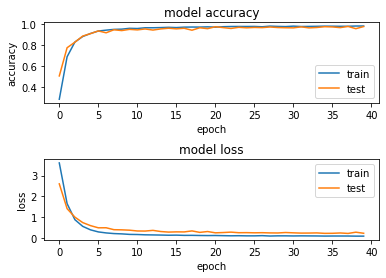

Final Test Accuracy: 0.9846686720848083


In [12]:
# Select the final model based on the max test accuracy across all models

best_model_index = model_accuracy.index(max(model_accuracy))

best_model = models[best_model_index]
best_model_history = model_history[best_model_index]
best_model_train_acc = model_train_acc[best_model_index]
best_model_train_loss = model_train_loss[best_model_index]
best_model_val_acc = model_val_acc[best_model_index]
best_model_val_loss = model_val_loss[best_model_index]

# summarize history for accuracy  
plt.subplot(211)  
plt.plot(best_model_history.history['accuracy'])  
plt.plot(best_model_history.history['val_accuracy'])  
plt.title('model accuracy')  
plt.ylabel('accuracy')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='lower right')  

# summarize history for loss
plt.subplot(212)  
plt.plot(best_model_history.history['loss'])  
plt.plot(best_model_history.history['val_loss'])  
plt.title('model loss')  
plt.ylabel('loss')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='upper right')  
plt.subplots_adjust(hspace=0.7)

plt.show() 

print("Final Test Accuracy:", model_accuracy[best_model_index])

In [13]:
# Evaluate the best model on the test data
y_pred = best_model.predict(X_test)

# np.argmax() is used to convert the one-hot encoded predictions and test labels to class labels.
y_pred_label = np.argmax(y_pred, axis = 1)

# Print the classification report
print("Classification report:\n", classification_report(y_test_enc, y_pred_label))


ValueError: in user code:

    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\training.py", line 2137, in predict_function  *
        return step_function(self, iterator)
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\training.py", line 2123, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\training.py", line 2111, in run_step  **
        outputs = model.predict_step(data)
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\training.py", line 2079, in predict_step
        return self(x, training=False)
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\input_spec.py", line 296, in assert_input_compatibility
        f'Input {input_index} of layer "{layer_name}" is '

    ValueError: Input 0 of layer "sequential_35" is incompatible with the layer: expected shape=(None, 18), found shape=(None, 20)


In [ ]:
# extract class labels from test data
class_test = y_test_enc

# Invert OsID_labels dictionary
inv_OsID_labels = {v: k for k, v in OsID_labels.items()}

# map OsID values to the class labels
OsID_test = [inv_OsID_labels.get(value, 'Unknown') for value in class_test]

# create dataframe with OsID, true class, predicted class, and true/false columns
results = pd.DataFrame({
    'OsID': OsID_test,
    'True Class': y_test_enc,
    'Predicted Class': y_pred_label,
    'True/False': class_test == y_pred_label
})

# display dataframe
print(results.head())

# save results_df to a CSV file
results.to_csv('MLP_gene classification.csv', index=False)

           OsID  True Class  Predicted Class  True/False
0  Os11g0704500         328              328        True
1  Os09g0279600         161              161        True
2  Os03g0669100          17               17        True
3  Os05g0542500          34               34        True
4  Os09g0522000           7                7        True
